In [1]:
import osmnx as ox
import pandas as pd
import geopandas as gpd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import ast
import pathlib
import time
import path
%matplotlib inline

In [2]:
# turn response caching on and turn on logging to your terminal window
ox.config(log_console=True, use_cache=True)

ox.__version__

'1.0.0'

In [3]:
def save_plot(fig, ax, filepath=None, dpi=300):
    
    imgs_folder = "./images"
    
    # default filepath, if none provided
    if filepath is None:
        filepath = pathlib.Path(imgs_folder) / "image.png"
    else:
        filepath = pathlib.Path(filepath)

    # if save folder does not already exist, create it
    filepath.parent.mkdir(parents=True, exist_ok=True)
    
    # get figure facecolor
    fc = fig.get_facecolor()
    # constrain saved figure's extent to interior of the axis
    extent = ax.bbox.transformed(fig.dpi_scale_trans.inverted())
    
    # temporarily turn figure frame on to save with facecolor
    fig.set_frameon(True)
    fig.savefig(filepath, 
                dpi=dpi, 
                bbox_inches=extent,
                facecolor=fc,  
                transparent=True,
               )
    fig.set_frameon(False)  # and turn it back off again

In [4]:
def add_name2plot():
    ax.text(0.01, 0.008, 
            "\nAnalysis of the road network of Mérida, Yucatán, México",
            horizontalalignment='left',
            verticalalignment='bottom',
            transform=ax.transAxes, 
            color='white', 
            fontsize=14,
            style='italic',
            bbox={'facecolor': 'grey', 'alpha': 0.5, 'pad': 10}
           )
    ax.text(0.01, 0.01, 
            "Alejandro Puerto Castro\n",
            horizontalalignment='left',
            verticalalignment='bottom',
            transform=ax.transAxes, 
            color='white', 
            fontsize=14,
            fontweight='bold',
           )

In [5]:
places = [{'county' : 'Merida',
           'state' : 'Yucatan',
           'country' : 'Mexico'},
          {'county' : 'Kanasin',
           'state' : 'Yucatan',
           'country' : 'Mexico'}]

def get_roads_osmnx(places, update=False, proj=False, crs=None):

    dirpath = pathlib.Path('./networks/')
    filepath = dirpath/'merida-kanasin-road.graphml'
    logpath = dirpath/'log'
                                    
    if filepath.exists() and not update:
        G = ox.load_graphml(filepath)
    else:
        # get drivable public streets network, aka road network, without service roads,
        # e.g. private, parking lots, etc.
        # use retain_all if you want to keep all disconnected subgraphs (e.g. when your places aren't adjacent)
        # TODO: It would be nice to setup up a polygon for the city and its surrounding areas, to be sure
        # exactly the location.
        G = ox.graph_from_place(places, network_type='drive')
        ox.save_graphml(G, filepath=filepath, gephi=False)
        
    if proj:
        G = ox.project_graph(G, to_crs=crs)
    
    print(f"Graph created at: {G.graph['created_date']}")
    return G, *ox.graph_to_gdfs(G)
        
#G, nodes, edges = get_roads_osmnx(places, update=False)
G_proj, nodes_proj, edges_proj = get_roads_osmnx(places, update=False, proj=True, crs=3857)

Graph created at: 2021-02-17 11:57:58


In [6]:
# get largest strongly connected component
Gs = ox.utils_graph.get_largest_component(G_proj, strongly=True)

In [7]:
print(f"The largest component has {Gs.number_of_edges()} edges and {Gs.number_of_nodes()} nodes")

The largest component has 102131 edges and 37746 nodes


In [8]:
# read road network stats of the city
stats_city = pd.read_csv('stats_road_network.csv', encoding='utf-8')

In [9]:
for col in stats_city.columns:
    print(col)

n
m
k_avg
intersection_count
streets_per_node_avg
streets_per_node_counts
streets_per_node_proportion
edge_length_total
edge_length_avg
street_length_total
street_length_avg
street_segments_count
node_density_km
intersection_density_km
edge_density_km
street_density_km
circuity_avg
self_loop_proportion
clean_intersection_count
clean_intersection_density_km
avg_neighbor_degree
avg_neighbor_degree_avg
avg_weighted_neighbor_degree
avg_weighted_neighbor_degree_avg
degree_centrality
degree_centrality_avg
clustering_coefficient
clustering_coefficient_avg
clustering_coefficient_weighted
clustering_coefficient_weighted_avg
pagerank
pagerank_max_node
pagerank_max
pagerank_min_node
pagerank_min
betweenness_centrality
betweenness_centrality_avg
closeness_centrality
closeness_centrality_avg
area_km
area
time


## Visualizing Betweenness centrality

In [10]:
btwn_scores = ast.literal_eval(stats_city['betweenness_centrality'].iloc[0])

In [11]:
max_node, max_bc = max(btwn_scores.items(), key=lambda x: x[1])

In [12]:
max_node, max_bc

(8229079034, 0.06618414910391013)

In the city of Mérida, Yucatán, the node with the highest betwenness centrality has ~7% of all shortest paths running through it. Let's highlight it in the plot:

In [13]:
nc = ['r' if node==max_node else 'w' for node in Gs.nodes()]
ns = [80 if node==max_node else 0 for node in Gs.nodes()]

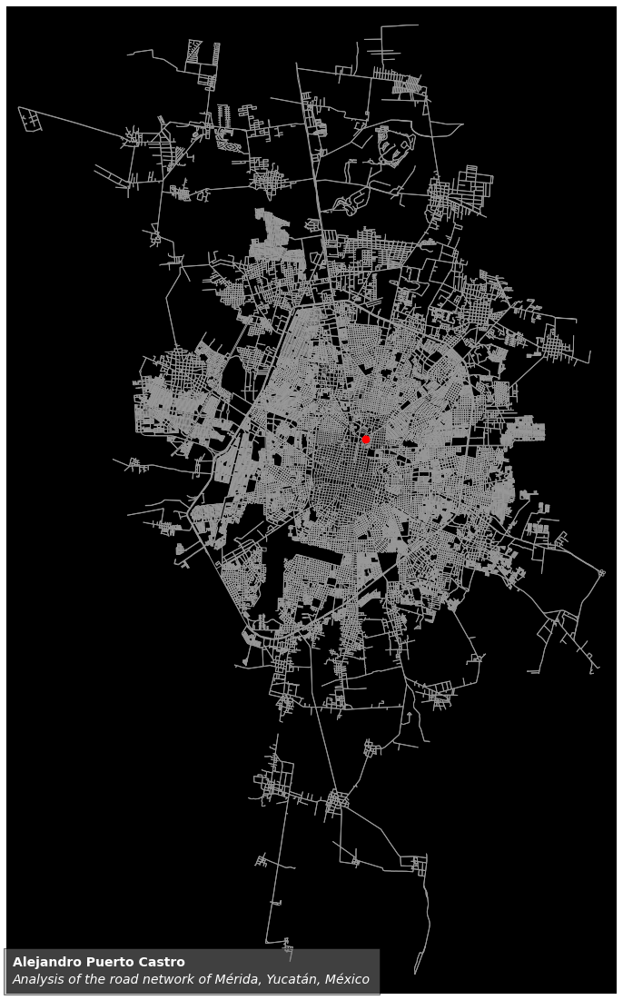

In [14]:
fig, ax = ox.plot_graph(Gs, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/betweenness_maxNode_wholeNetwork.png', dpi=500)
plt.show()

A closer look:

In [15]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9774, -89.6169)
G_closer_simp = ox.graph_from_point(location_point, dist=10000, simplify=True, network_type='drive')
G_closer_simp_proj = ox.project_graph(G_closer_simp, to_crs=3857)

In [16]:
nc = ['r' if node==max_node else 'w' for node in G_closer_simp_proj.nodes()]
ns = [80 if node==max_node else 0 for node in G_closer_simp_proj.nodes()]

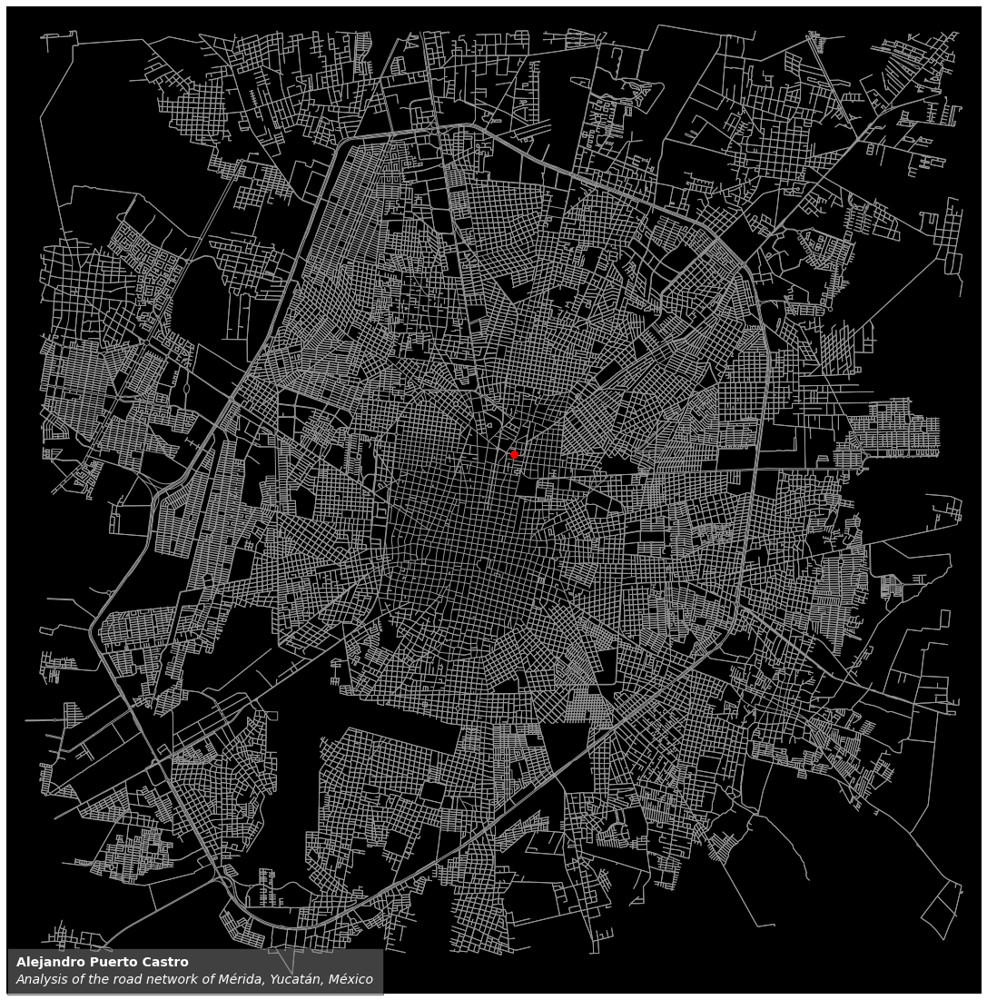

In [17]:
fig, ax = ox.plot_graph(G_closer_simp_proj, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', 
                        figsize=(20, 20),
                        show=False
                       )
add_name2plot()
save_plot(fig, ax, filepath='images/betweenness_maxNode_ZoomCity.png', dpi=300)
plt.show()

A more closer look:

In [18]:
# create a network around some (lat, lng) point and plot it
location_point = (20.98476, -89.61411)
G_closerer_simp = ox.graph_from_point(location_point, dist=1000, network_type='drive')
G_closerer_simp_proj = ox.project_graph(G_closerer_simp, to_crs=3857)

In [19]:
nc = ['r' if node==max_node else 'w' for node in G_closerer_simp_proj.nodes()]
ns = [80 if node==max_node else 0 for node in G_closerer_simp_proj.nodes()]

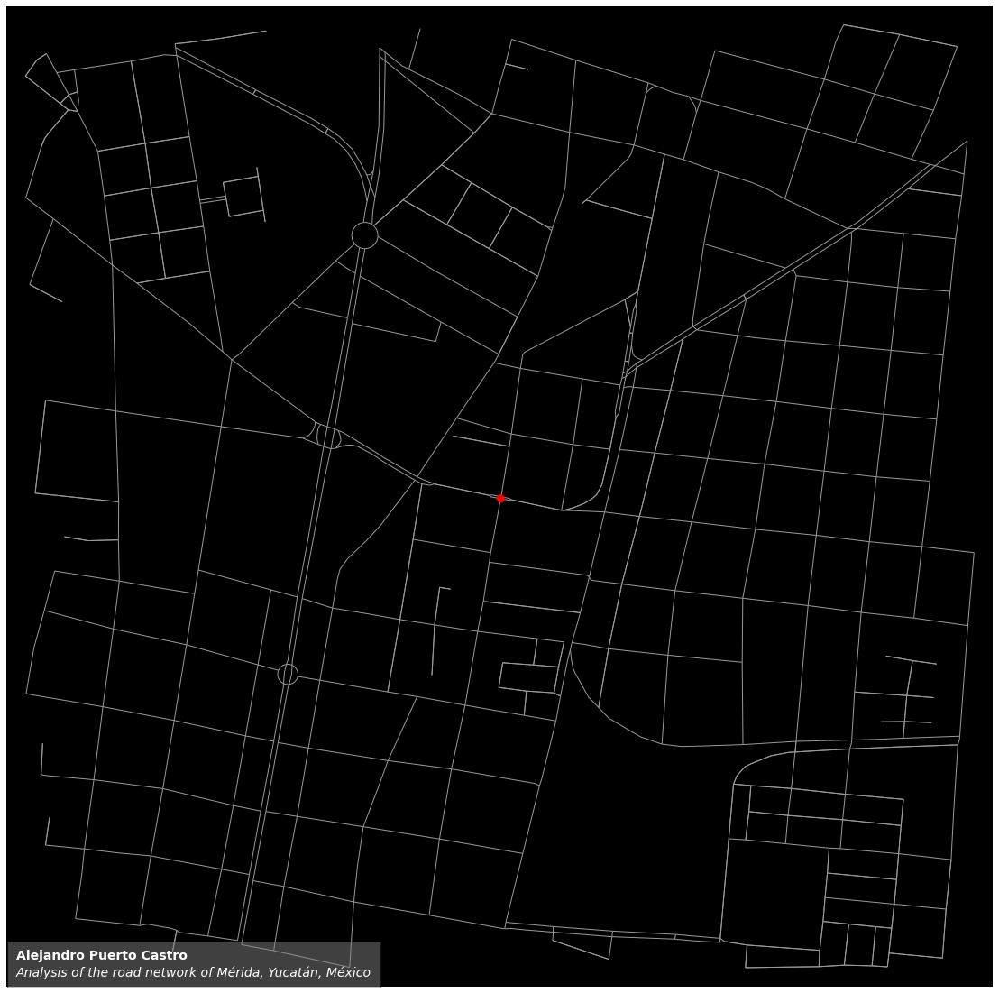

In [20]:
#fig, ax = plt.subplots(figsize=(20, 20), bgcolor='k')
fig, ax = ox.plot_graph(G_closerer_simp_proj,  
                        node_size=ns, 
                        node_color=nc, 
                        node_zorder=2, 
                        bgcolor='k',
                        figsize=(20, 20), 
                        show=False
                       )

add_name2plot()
save_plot(fig, ax, filepath='images/betweenness_maxNode_ZoomSection.png', dpi=300)
plt.show()

This node is the intersection at 52 street and Perez Ponce Avenue. View in OpenStreetMap: https://www.openstreetmap.org/search?whereami=1&query=20.98476%2C-89.61411#map=19/20.98477/-89.61409

~7% of all shortest paths run through the node highlighted in red. Let's look at the relative betweenness centrality of every node in the graph:

In [21]:
nx.set_node_attributes(Gs, btwn_scores, 'betweenness')
nc = ox.plot.get_node_colors_by_attr(Gs, 'betweenness', cmap='plasma')

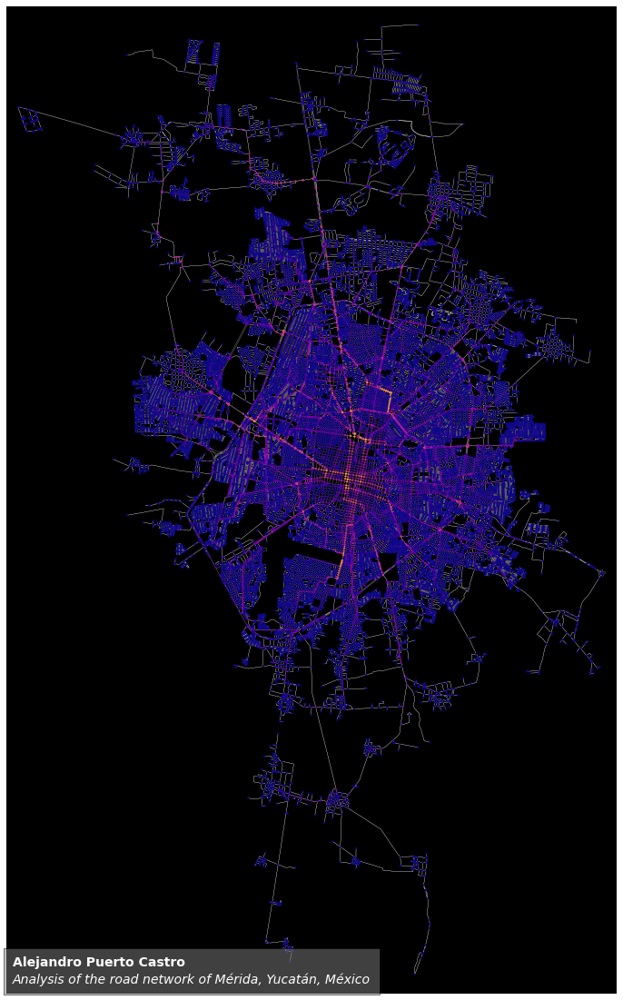

In [22]:
fig, ax = ox.plot_graph(Gs, node_color=nc, node_size=5, node_zorder=2,
                        edge_linewidth=0.2, edge_color='w', bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/betweenness_allNodes.png', dpi=500)
plt.show()

Above, the nodes are visualized by betweenness centrality, from low (dark violet) to high (light yellow). The colors in the colorspace are linearly mapped to the attribute values.

## Visualizing Closeness centrality

In [23]:
closeness_scores = ast.literal_eval(stats_city['closeness_centrality'].iloc[0])

In [24]:
max_node, max_cc = max(closeness_scores.items(), key=lambda x: x[1])

In [25]:
max_node, max_cc

(831384158, 0.00011296031630538429)

In [26]:
nc = ['r' if node==max_node else 'w' for node in Gs.nodes()]
ns = [80 if node==max_node else 0 for node in Gs.nodes()]

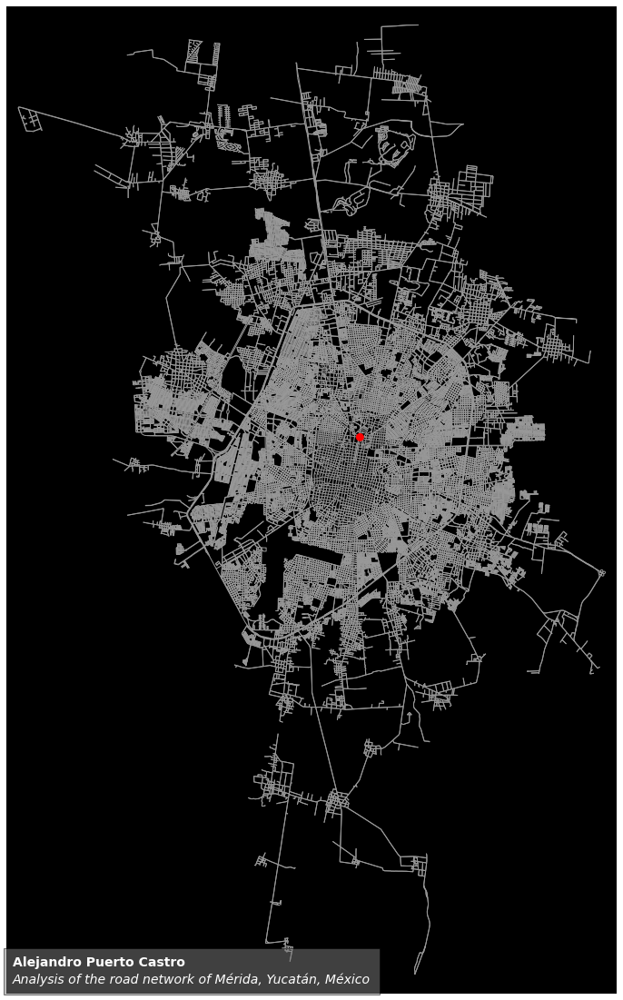

In [27]:
fig, ax = ox.plot_graph(Gs, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/closeness_maxNode_wholeNetwork.png', dpi=500)
plt.show()

A closer look:

In [28]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9774, -89.6169)
G_closer = ox.graph_from_point(location_point, dist=10000, simplify=False, network_type='drive')
G_closer_proj = ox.project_graph(G_closer, to_crs=3857)

In [29]:
nc = ['r' if node==max_node else 'w' for node in G_closer_proj.nodes()]
ns = [80 if node==max_node else 0 for node in G_closer_proj.nodes()]

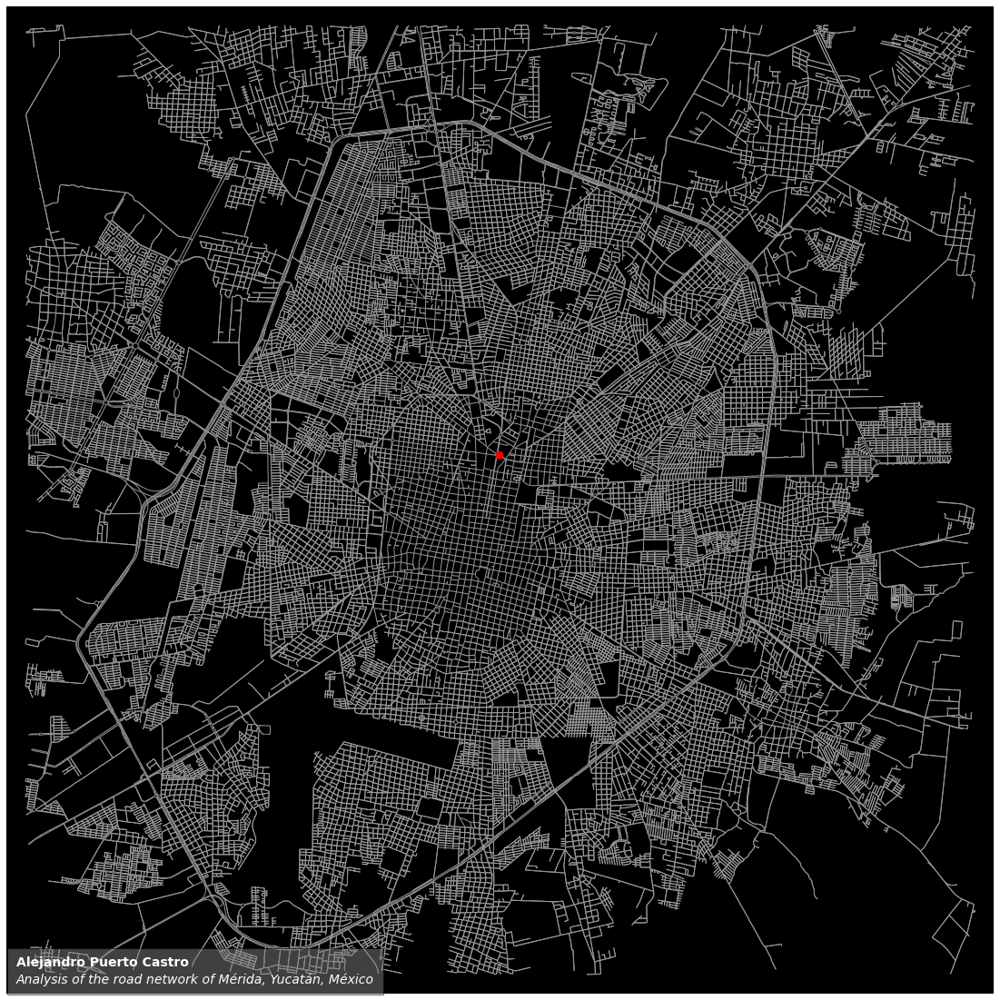

In [30]:
fig, ax = ox.plot_graph(G_closer_proj, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/closeness_maxNode_ZoomCity.png', dpi=300)
plt.show()

A more closer look: 

In [31]:
# create a network around some (lat, lng) point and plot it
location_point = (20.98476, -89.61411)
G_closerer = ox.graph_from_point(location_point, dist=1000, simplify=False, network_type='drive')
G_closerer_proj = ox.project_graph(G_closerer, to_crs=3857)

In [32]:
nc = ['r' if node==max_node else 'w' for node in G_closerer_proj.nodes()]
ns = [80 if node==max_node else 0 for node in G_closerer_proj.nodes()]

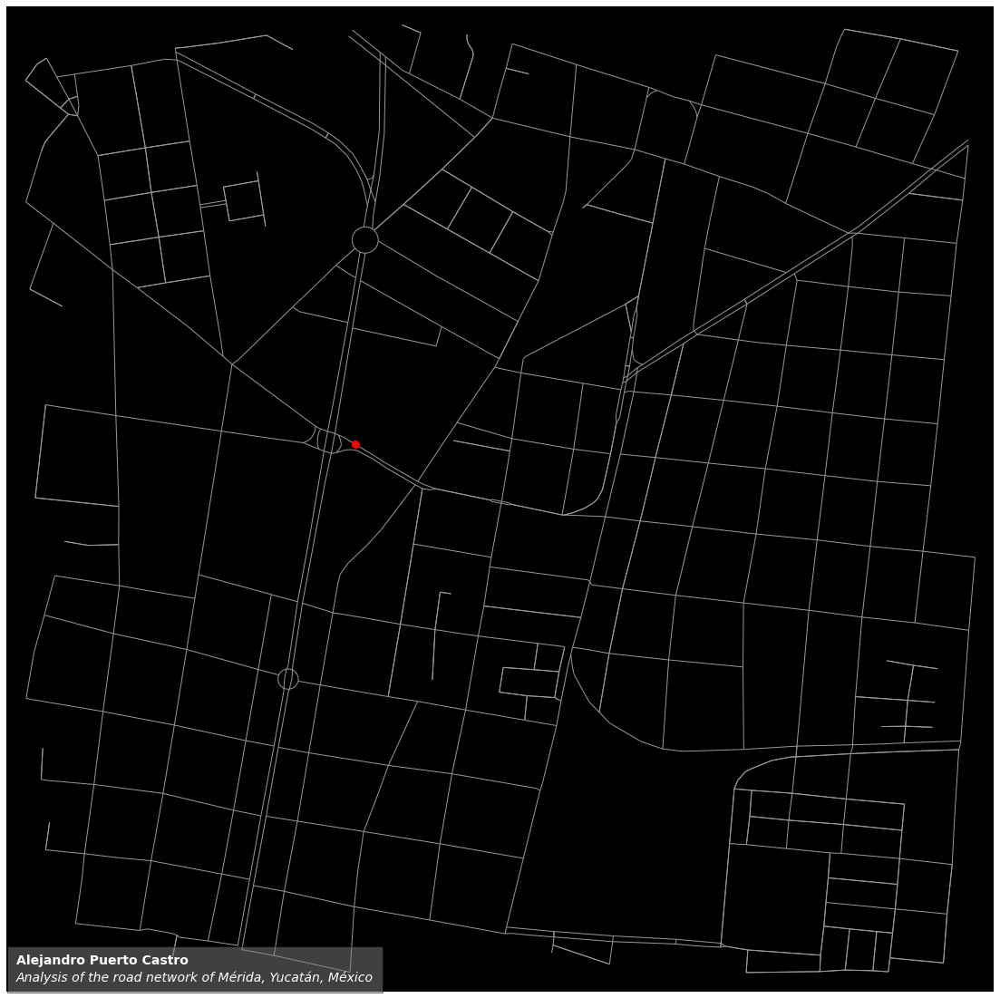

In [33]:
fig, ax = ox.plot_graph(G_closerer_proj, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/closeness_maxNode_ZoomSection.png', dpi=300)
plt.show()

This node is located at the Perez Ponce Avenue and Paseo de Montejo. View in OpenStreetMap: https://www.openstreetmap.org/search?whereami=1&query=20.98584%2C-89.61702#map=19/20.98584/-89.61702

In [34]:
nx.set_node_attributes(Gs, closeness_scores, 'closeness')
nc = ox.plot.get_node_colors_by_attr(Gs, 'closeness', cmap='plasma')

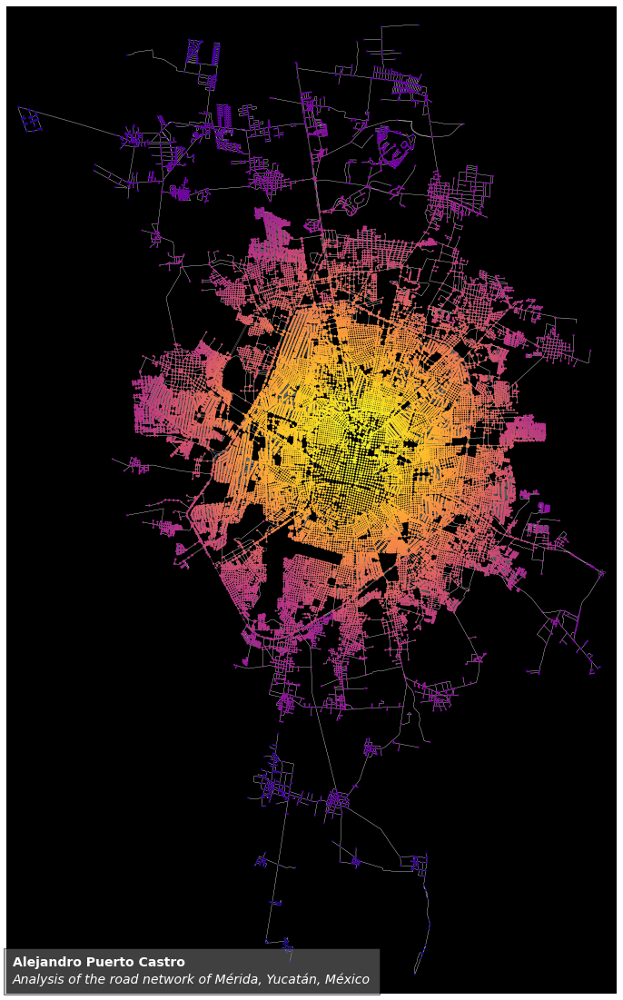

In [35]:
fig, ax = ox.plot_graph(Gs, node_color=nc, node_size=5, node_zorder=2,
                        edge_linewidth=0.2, edge_color='w', bgcolor='k', figsize=(20, 20), show=False)
add_name2plot()
save_plot(fig, ax, filepath='images/closeness_allNodes.png', dpi=500)
plt.show()

## Visualizing PageRank

### Max PageRank

In [36]:
max_node, max_pr = stats_city['pagerank_max_node'].iloc[0], stats_city['pagerank_max'].iloc[0]

In [37]:
max_node

3731200487

In [38]:
nc = ['r' if node==max_node else 'w' for node in Gs.nodes()]
ns = [80 if node==max_node else 0 for node in Gs.nodes()]

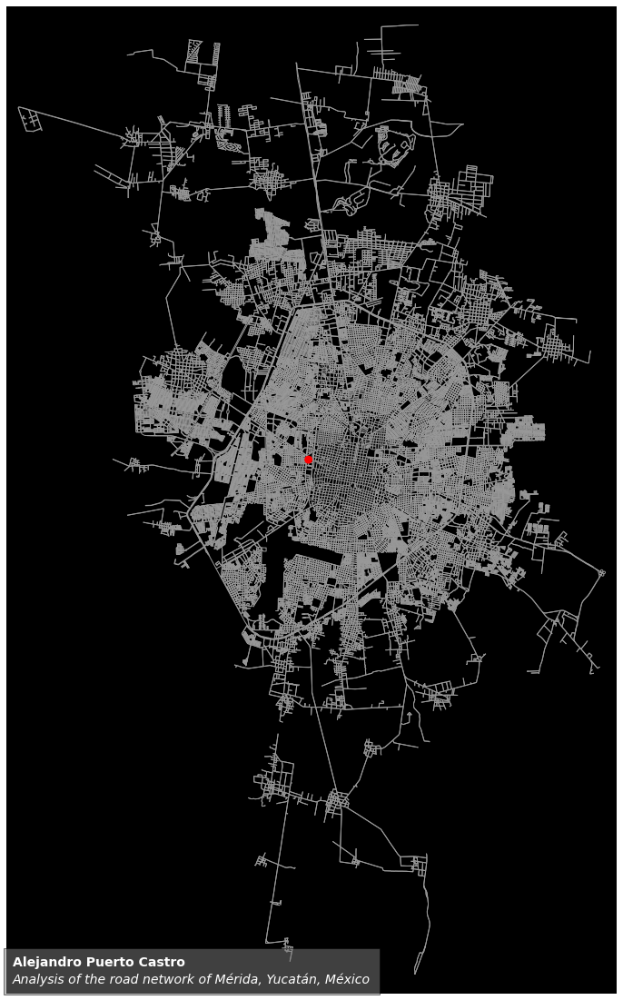

In [39]:
fig, ax = ox.plot_graph(Gs, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/pagerank_maxNode_wholeNetwork.png', dpi=500)
plt.show()

In [40]:
nc = ['r' if node==max_node else 'w' for node in G_closer_simp_proj.nodes()]
ns = [80 if node==max_node else 0 for node in G_closer_simp_proj.nodes()]

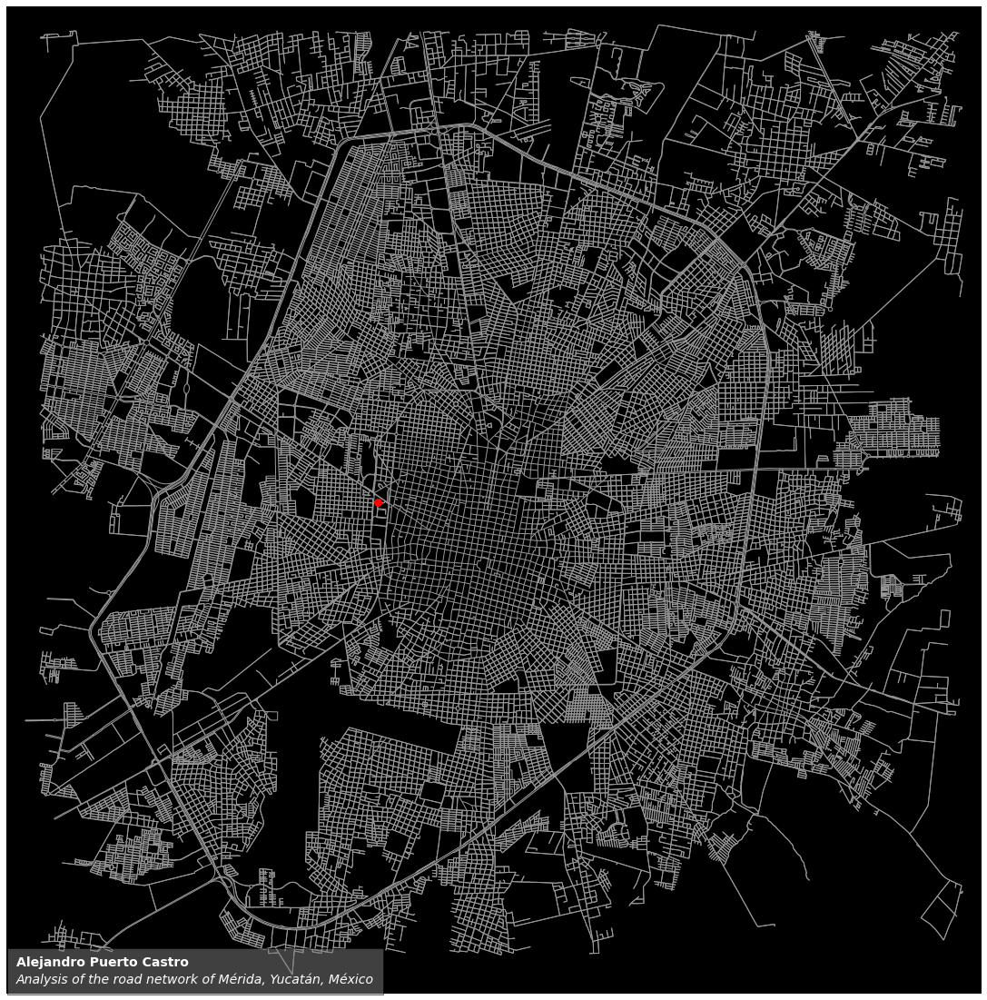

In [41]:
fig, ax = ox.plot_graph(G_closer_simp_proj, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/pagerank_maxNode_ZoomCity.png', dpi=300)
plt.show()

A more closer look:

In [42]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9754, -89.6426)
G_closerer_simp = ox.graph_from_point(location_point, dist=1000, simplify=True, network_type='drive')
G_closerer_simp_proj = ox.project_graph(G_closerer_simp, to_crs=3857)

In [43]:
for node in G_closerer_simp_proj.nodes():
    if node==max_node:
        print(node)

3731200487


In [44]:
nc = ['r' if node==max_node else 'w' for node in G_closerer_simp_proj.nodes()]
ns = [80 if node==max_node else 0 for node in G_closerer_simp_proj.nodes()]

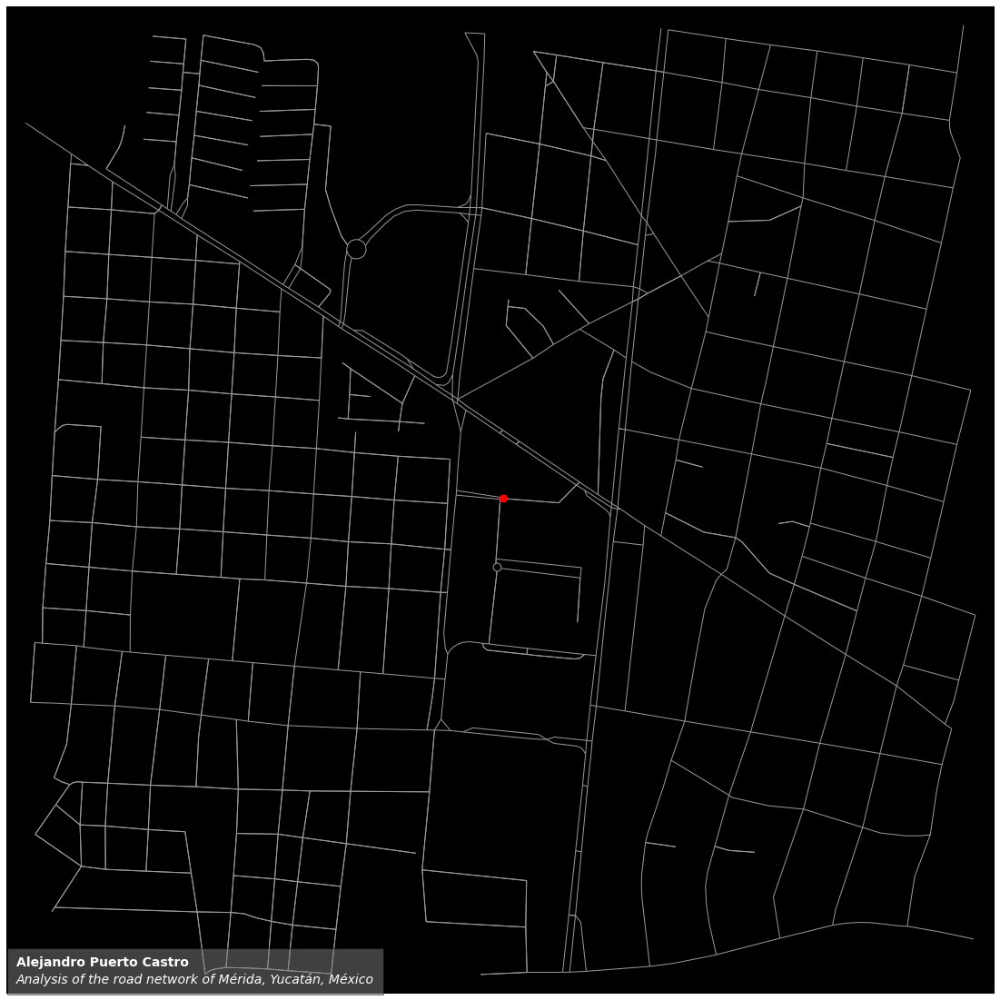

In [45]:
fig, ax = ox.plot_graph(G_closerer_simp_proj, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/pagerank_maxNode_ZoomSection.png', dpi=300)
plt.show()

This node is located at 59 Diagonal street at the back of the O'Horan Hospital. View in OpenStreetMap: https://www.openstreetmap.org/search?whereami=1&query=20.9754%2C-89.6426#map=17/20.97582/-89.64051

### Min PageRank

In [46]:
min_node, min_pr = stats_city['pagerank_min_node'].iloc[0], stats_city['pagerank_min'].iloc[0]

In [47]:
nc = ['r' if node==min_node else 'w' for node in Gs.nodes()]
ns = [80 if node==min_node else 0 for node in Gs.nodes()]

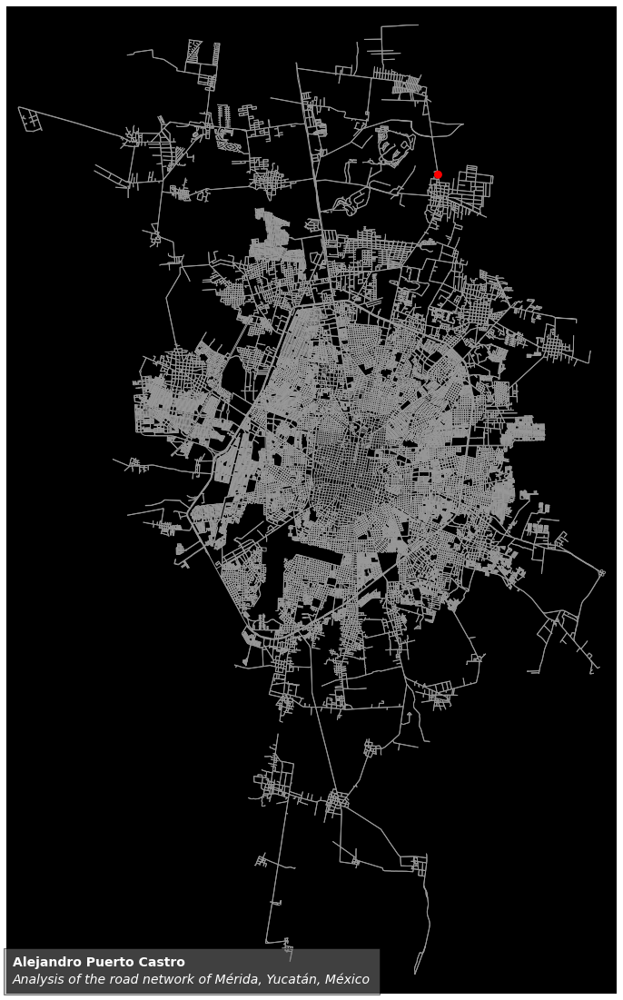

In [48]:
fig, ax = ox.plot_graph(Gs, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/pagerank_minNode_wholeNetwork.png', dpi=500)
plt.show()

In [49]:
# create a network around some (lat, lng) point and plot it
location_point = (21.0976, -89.5801)
G_closer = ox.graph_from_point(location_point, dist=10000, simplify=False, #network_type='drive'
                              )
G_closer_proj = ox.project_graph(G_closer, to_crs=3857)

In [50]:
nc = ['r' if node==min_node else 'w' for node in G_closer_proj.nodes()]
ns = [80 if node==min_node else 0 for node in G_closer_proj.nodes()]

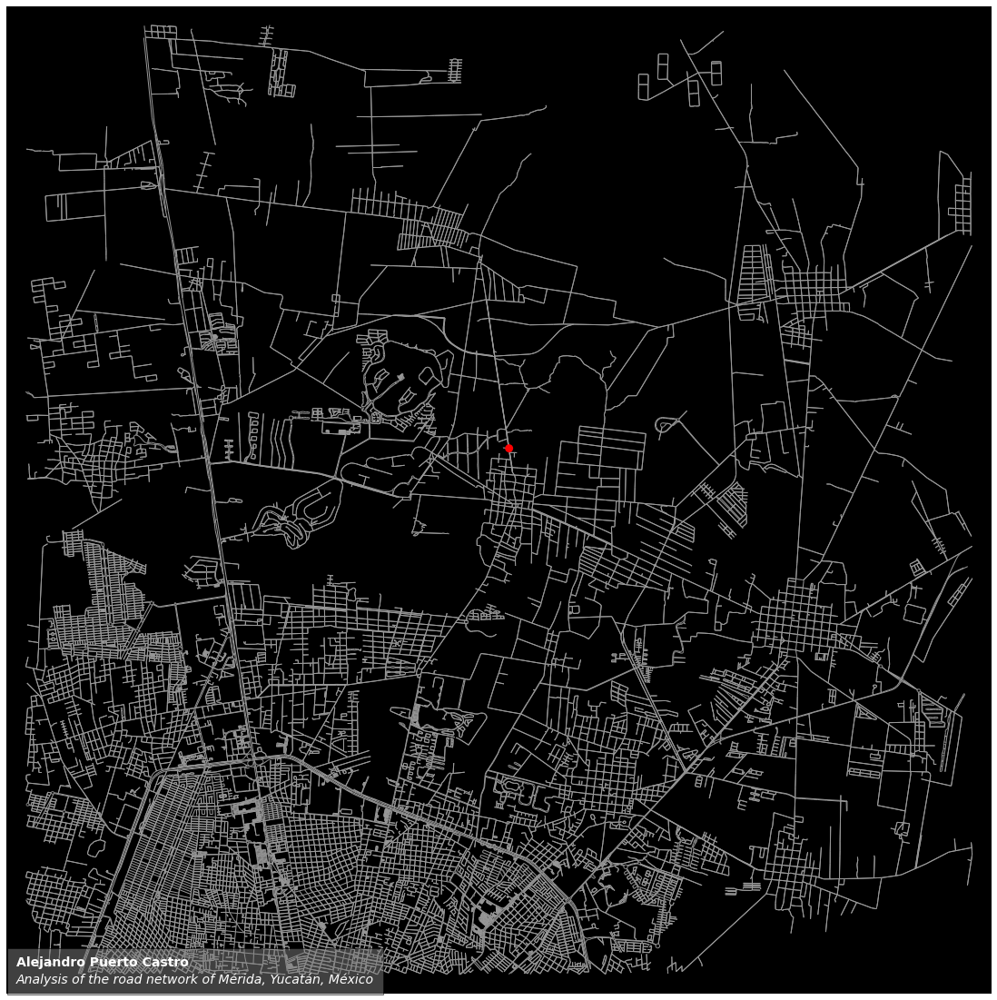

In [51]:
fig, ax = ox.plot_graph(G_closer_proj, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/pagerank_minNode_ZoomCity.png', dpi=300)
plt.show()

A more closer look:

In [52]:
# create a network around some (lat, lng) point and plot it
location_point = (21.1072, -89.5785)
G_closerer = ox.graph_from_point(location_point, dist=1000, simplify=False, #network_type='drive'
                                     )
G_closerer_proj = ox.project_graph(G_closerer, to_crs=3857)

In [53]:
nc = ['r' if node==min_node else 'w' for node in G_closerer_proj.nodes()]
ns = [80 if node==min_node else 0 for node in G_closerer_proj.nodes()]

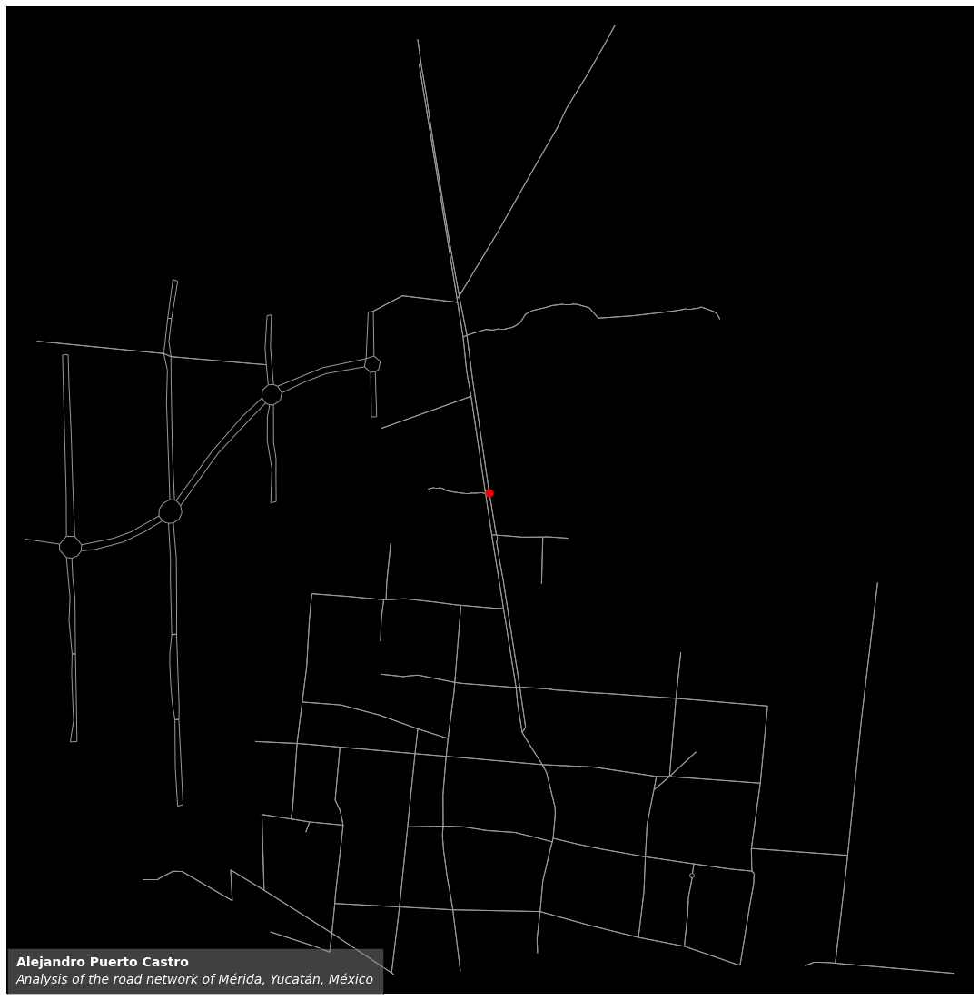

In [54]:
fig, ax = ox.plot_graph(G_closerer_proj, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/pagerank_minNode_ZoomSection.png', dpi=300)
plt.show()

This node is located at 20 street and Chablekal road. It is at the entrance of the Centro de Investigación Animal Aplicada de Yucatán. View in OpenStreetMap: https://www.openstreetmap.org/search?whereami=1&query=21.10729%2C-89.57841#map=18/21.10729/-89.57841

In [55]:
pagerank = ast.literal_eval(stats_city['pagerank'].iloc[0])

In [56]:
nx.set_node_attributes(Gs, pagerank, 'pagerank')
nc = ox.plot.get_node_colors_by_attr(Gs, 'pagerank', cmap='plasma')

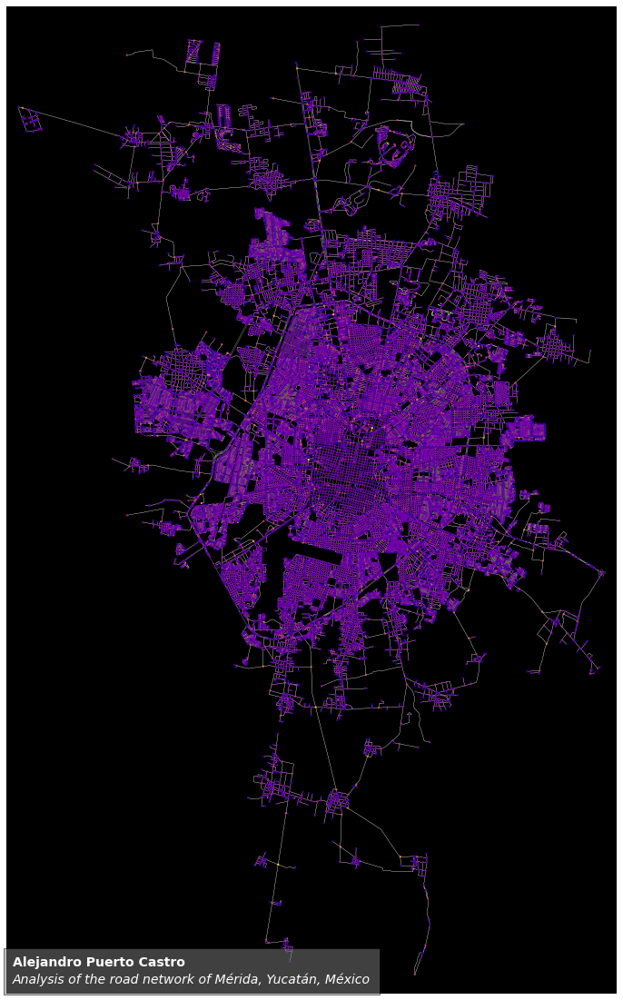

In [57]:
fig, ax = ox.plot_graph(Gs, node_color=nc, node_size=5, node_zorder=2,
                        edge_linewidth=0.2, edge_color='w', bgcolor='k', figsize=(20, 20), show=False)
add_name2plot()
save_plot(fig, ax, filepath='images/pagerank_allNodes.png', dpi=500)
plt.show()

## Visualizing Degree Centrality

In [58]:
degree_centrality = ast.literal_eval(stats_city['degree_centrality'].iloc[0])

In [59]:
max_node, max_dc = max(degree_centrality.items(), key=lambda x: x[1])

In [60]:
max_node, max_dc

(287684975, 0.00026493575307987813)

In [61]:
nc = ['r' if node==max_node else 'w' for node in Gs.nodes()]
ns = [80 if node==max_node else 0 for node in Gs.nodes()]

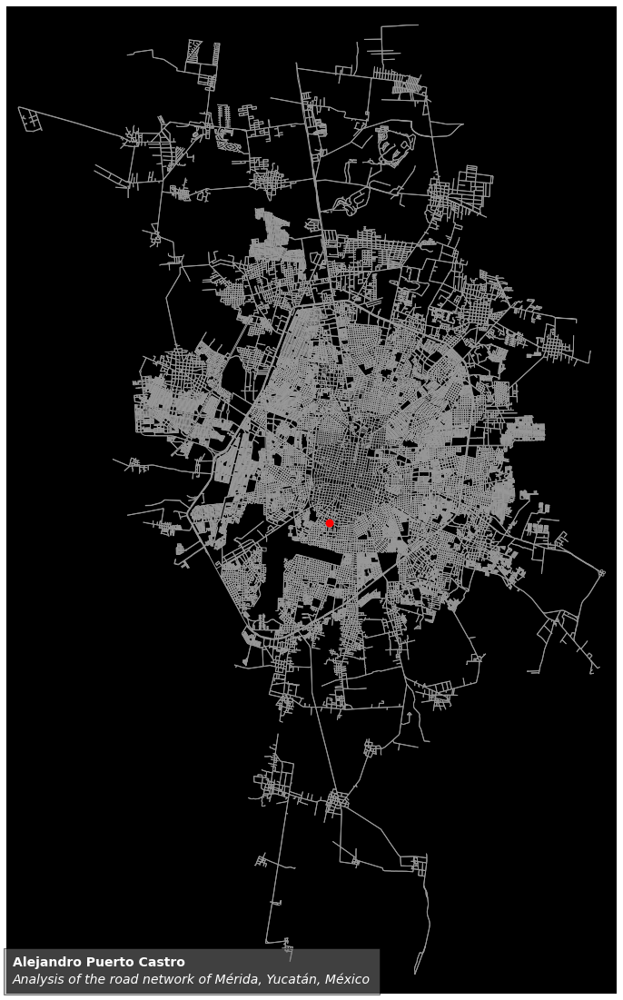

In [62]:
fig, ax = ox.plot_graph(Gs, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/degreeCent_maxNode_wholeNetwork.png', dpi=500)
plt.show()

A closer look:

In [63]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9774, -89.6169)
G_closer_simp = ox.graph_from_point(location_point, dist=10000, simplify=True, network_type='drive')
G_closer_simp_proj = ox.project_graph(G_closer_simp, to_crs=3857)

In [64]:
for node in G_closer_proj.nodes():
    if node==max_node:
        print(node)

In [65]:
nc = ['r' if node==max_node else 'w' for node in G_closer_simp_proj.nodes()]
ns = [80 if node==max_node else 0 for node in G_closer_simp_proj.nodes()]

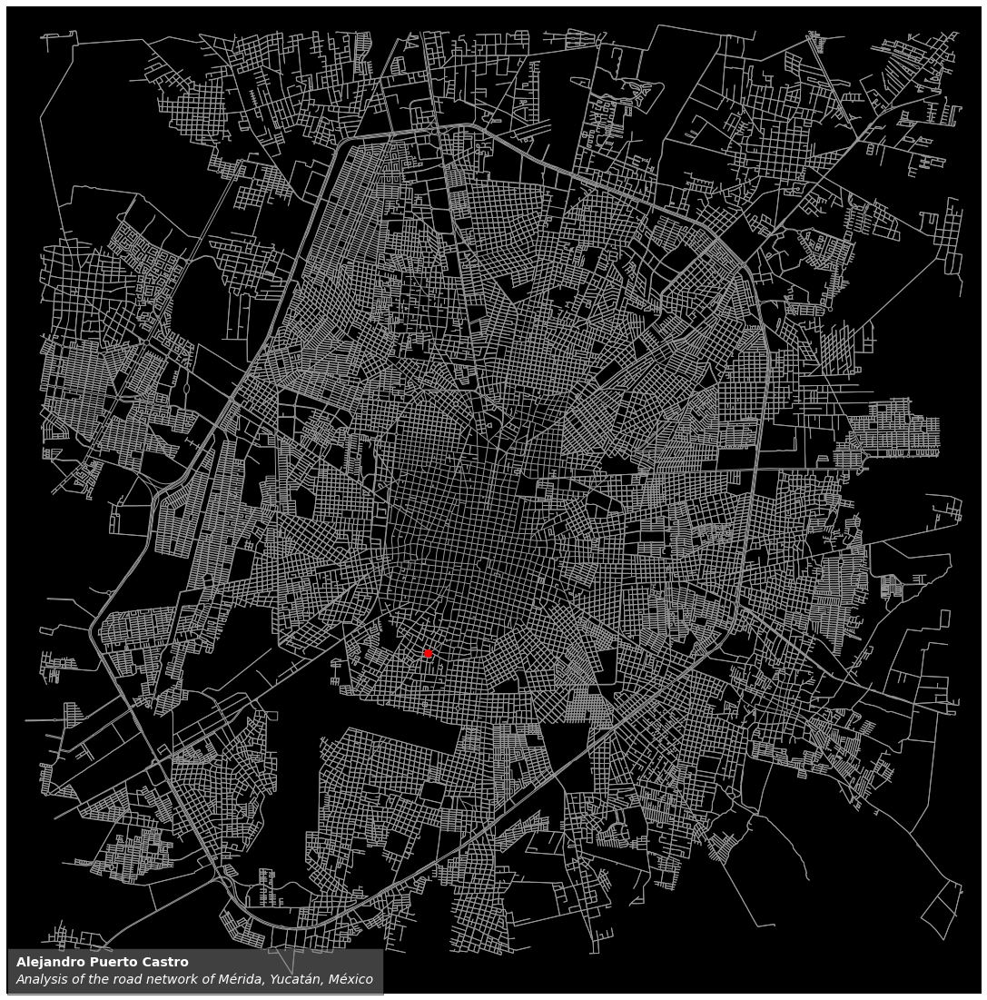

In [66]:
fig, ax = ox.plot_graph(G_closer_simp_proj, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/degreeCent_maxNode_ZoomCity.png', dpi=300)
plt.show()

A more closer look: 

In [67]:
# create a network around some (lat, lng) point and plot it
location_point = (20.9462, -89.6317)
G_closerer_simp = ox.graph_from_point(location_point, dist=1000, simplify=True, network_type='drive')
G_closerer_simp_proj = ox.project_graph(G_closerer_simp, to_crs=3857)

In [68]:
nc = ['r' if node==max_node else 'w' for node in G_closerer_simp_proj.nodes()]
ns = [80 if node==max_node else 0 for node in G_closerer_simp_proj.nodes()]

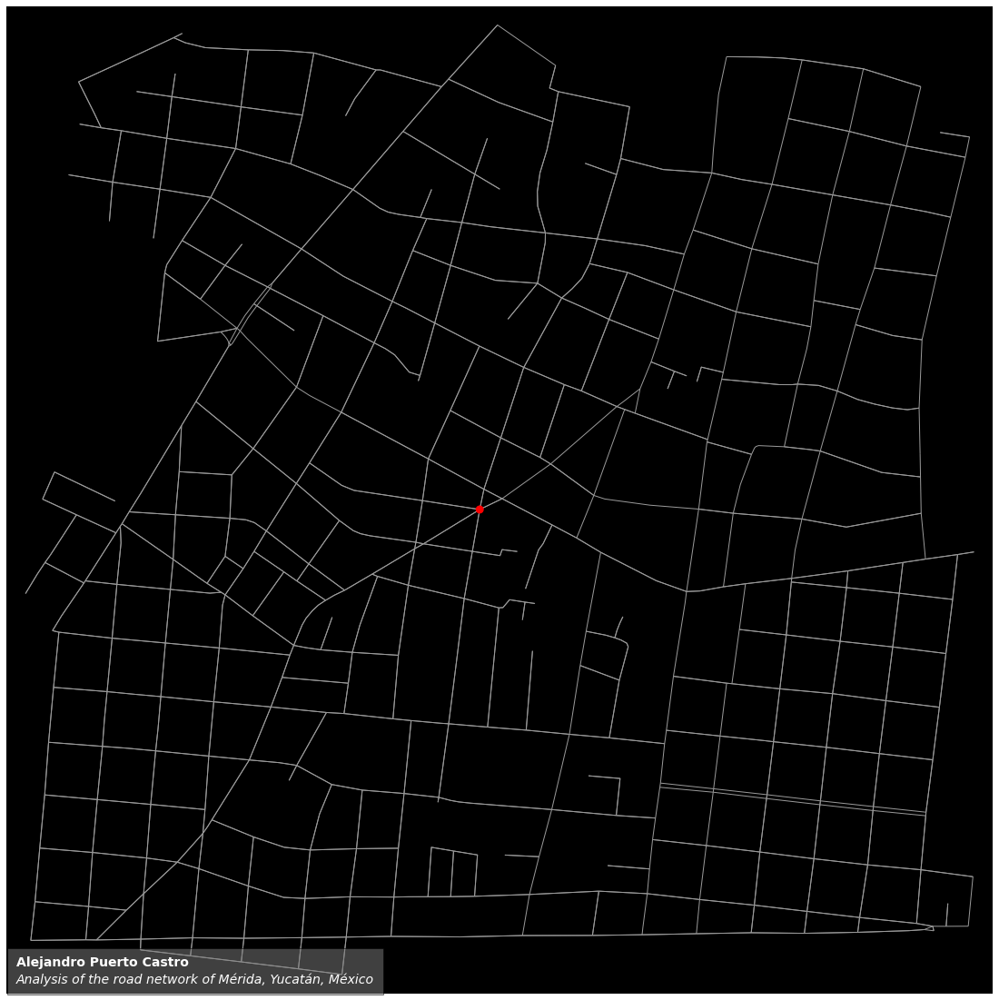

In [69]:
fig, ax = ox.plot_graph(G_closerer_simp_proj, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/degreeCent_maxNode_ZoomSection.png', dpi=300)
plt.show()

This node is located at 64 street with 95 and 75 street, colonia Meliton Salazar. View in OpenStreetMap: https://www.openstreetmap.org/search?whereami=1&query=20.94602%2C-89.63212#map=18/20.94602/-89.63212

In [70]:
nx.set_node_attributes(Gs, degree_centrality, 'degree_centrality')
nc = ox.plot.get_node_colors_by_attr(Gs, 'degree_centrality', cmap='plasma')

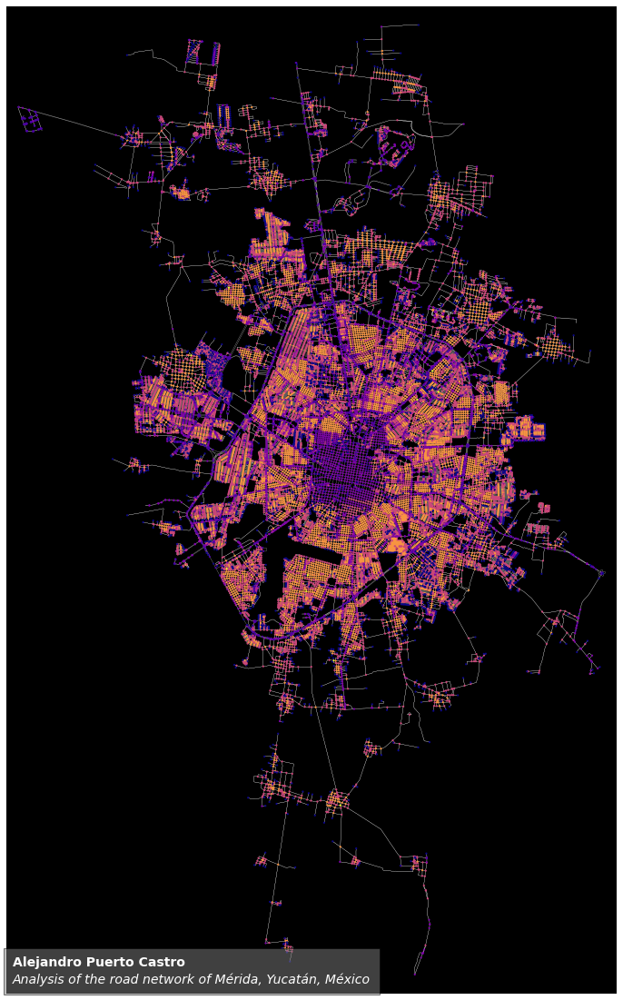

In [71]:
fig, ax = ox.plot_graph(Gs, node_color=nc, node_size=5, node_zorder=2,
                        edge_linewidth=0.2, edge_color='w', bgcolor='k', figsize=(20, 20), show=False)
add_name2plot()
save_plot(fig, ax, filepath='images/degreeCent_allNodes.png', dpi=500)
plt.show()

## Visualizing Clustering Coefficient

In [72]:
clustering_coef = ast.literal_eval(stats_city['clustering_coefficient'].iloc[0])

In [73]:
max_node, max_cc = max(clustering_coef.items(), key=lambda x: x[1])

In [74]:
max_node, max_cc

(1604332766, 1.0)

In [75]:
nc = ['r' if node==max_node else 'w' for node in Gs.nodes()]
ns = [80 if node==max_node else 0 for node in Gs.nodes()]

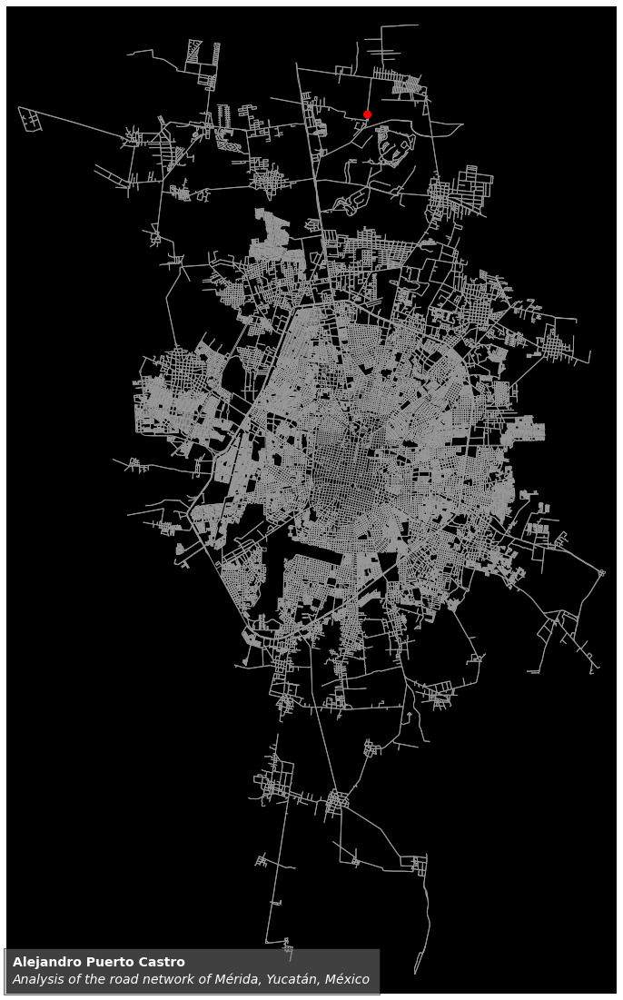

In [76]:
fig, ax = ox.plot_graph(Gs, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/clusteringCoef_maxNode_wholeNetwork.png', dpi=500)
plt.show()

In [77]:
nx.set_node_attributes(Gs, clustering_coef, 'clustering_coef')
nc = ox.plot.get_node_colors_by_attr(Gs, 'clustering_coef', cmap='plasma')

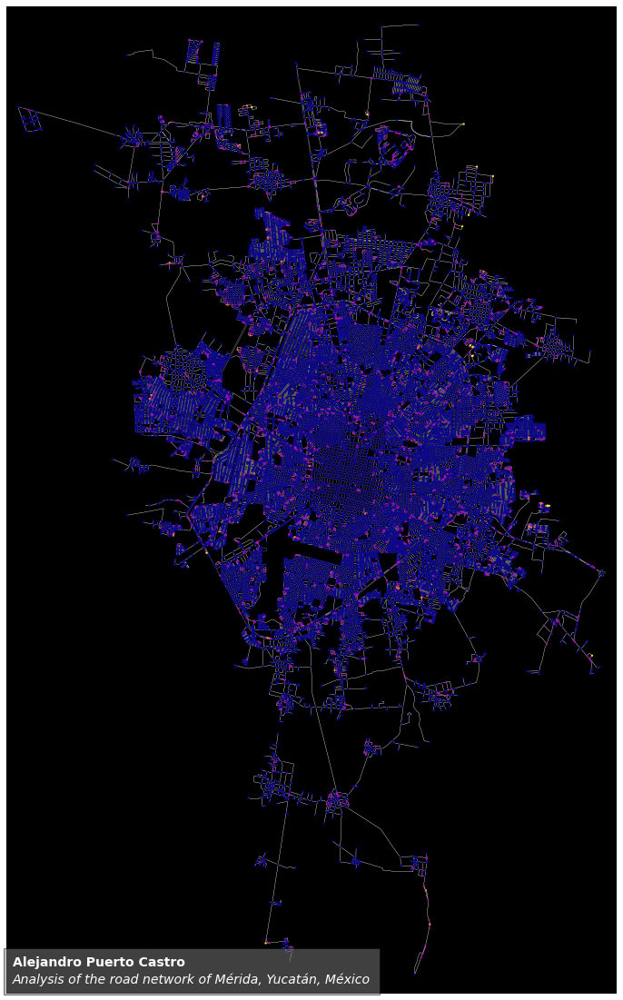

In [78]:
fig, ax = ox.plot_graph(Gs, node_color=nc, node_size=5, node_zorder=2,
                        edge_linewidth=0.2, edge_color='w', bgcolor='k', figsize=(20, 20), show=False)
add_name2plot()
save_plot(fig, ax, filepath='images/clusteringCoef_allNodes.png', dpi=500)
plt.show()

## Visualizing Weighted Clustering Coefficient

In [79]:
wcc = ast.literal_eval(stats_city['clustering_coefficient_weighted'].iloc[0])

In [80]:
max_node, max_wcc = max(wcc.items(), key=lambda x: x[1])

In [81]:
max_node, max_wcc

(8085702315, 0.29687565313580816)

In [82]:
nc = ['r' if node==max_node else 'w' for node in Gs.nodes()]
ns = [80 if node==max_node else 0 for node in Gs.nodes()]

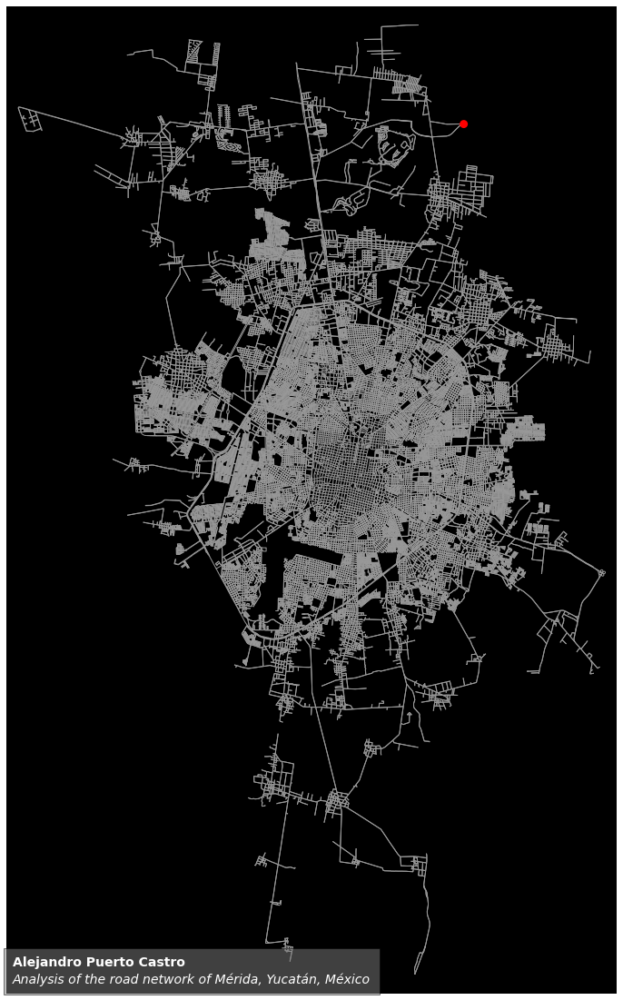

In [83]:
fig, ax = ox.plot_graph(Gs, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k', figsize=(20, 20), show=False)

add_name2plot()
save_plot(fig, ax, filepath='images/clusteringCoefWeighted_maxNode_wholeNetwork.png', dpi=500)
plt.show()

In [84]:
nx.set_node_attributes(Gs, wcc, 'clustering_coef_weighted')
nc = ox.plot.get_node_colors_by_attr(Gs, 'clustering_coef_weighted', cmap='plasma')

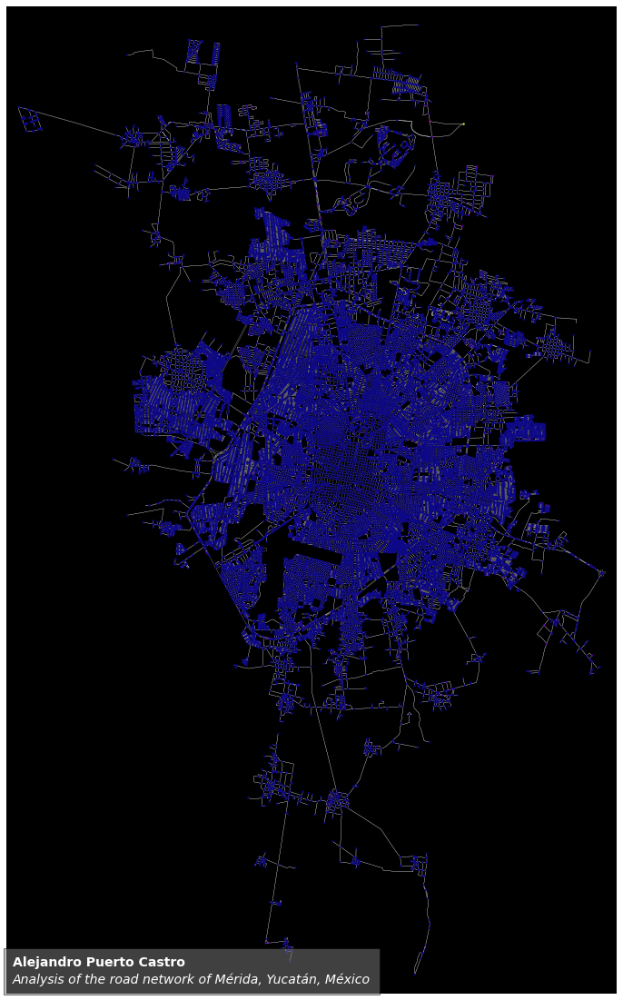

In [85]:
fig, ax = ox.plot_graph(Gs, node_color=nc, node_size=5, node_zorder=2,
                        edge_linewidth=0.2, edge_color='w', bgcolor='k', figsize=(20, 20), show=False)
add_name2plot()
save_plot(fig, ax, filepath='images/clusteringCoefWeighted_allNodes.png', dpi=500)
plt.show()